### **Big Data Project: improve efficiency and effectiveness for bank marketing**

The incresing data is from a bank in Portuguese trying to absorb term deposits. There are 45,211 instances with 16 features. The data is related with direct marketing campaigns of a Portuguese banking institution. The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the bank term deposit would be ('yes') or not ('no') subscribed. 
- The business goal is to find the clients who will possibly subscribe, and contact them before other banks with high successful rate.
- Data source: UCI https://archive.ics.uci.edu/dataset/222/bank+marketing

## Load and Prepare Data

In [0]:
from pyspark.sql.functions import col

# Load data
df = spark.read.csv("/FileStore/tables/bank_marketing.csv", 
                   header=True, 
                   inferSchema=True)

# Data cleaning
df = (df.drop('duration')                  # Drop call duration (leakage)
      .dropDuplicates(["_c0"])             # Remove duplicates
      .dropna()                            # Drop missing values
      .sort('_c0')                         # Sort by ID
      .drop('_c0')                         # Drop ID column
      .withColumnRenamed("y", "term_deposit"))  # Rename target


## **Insights of the Data**

Target variable 

In [0]:
# =============================================
# CLASS DISTRIBUTION ANALYSIS (Before Balancing)
# =============================================
from pyspark.sql.functions import col, count, when, lit, round

# Calculate class distribution
class_dist = df.groupBy("term_deposit").agg(
    count("*").alias("count"),
    round((count("*") / df.count()) * 100, 2).alias("percentage")
).orderBy("term_deposit")
class_dist_show = class_dist.select(['term_deposit','percentage'])

# Show raw counts and percentages
print("Class Distribution Before Balancing:")
display(class_dist_show)


Class Distribution Before Balancing:


term_deposit,percentage
no,88.3
yes,11.7


Databricks visualization. Run in Databricks to view.

Abvoe Table and bar chart visualization show the data is not balanced, there are almost 90% no independent variable and only 10% of yes. Balancing is needed for later modeling for a unbiased result.

In [0]:
display(df)

age,job,marital,education,default,balance,housing,loan,contact,day,month,campaign,pdays,previous,poutcome,term_deposit
58,management,married,tertiary,no,2143,yes,no,unknown,5,may,1,-1,0,unknown,no
44,technician,single,secondary,no,29,yes,no,unknown,5,may,1,-1,0,unknown,no
33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,1,-1,0,unknown,no
47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,1,-1,0,unknown,no
33,unknown,single,unknown,no,1,no,no,unknown,5,may,1,-1,0,unknown,no
35,management,married,tertiary,no,231,yes,no,unknown,5,may,1,-1,0,unknown,no
28,management,single,tertiary,no,447,yes,yes,unknown,5,may,1,-1,0,unknown,no
42,entrepreneur,divorced,tertiary,yes,2,yes,no,unknown,5,may,1,-1,0,unknown,no
58,retired,married,primary,no,121,yes,no,unknown,5,may,1,-1,0,unknown,no
43,technician,single,secondary,no,593,yes,no,unknown,5,may,1,-1,0,unknown,no


📅 Monthly Term Deposit Acceptance Trend


In [0]:
df.createOrReplaceTempView("bank_data")
monthly_acceptance = spark.sql("""
SELECT 
  month,
  COUNT(*) AS total_contacts,
  SUM(CASE WHEN term_deposit = 'yes' THEN 1 ELSE 0 END) AS accepted_deposits,
  ROUND(100.0 * SUM(CASE WHEN term_deposit = 'yes' THEN 1 ELSE 0 END) / COUNT(*), 2) AS acceptance_rate
FROM bank_data
GROUP BY month
ORDER BY acceptance_rate DESC
""")

display(monthly_acceptance.select(['month','acceptance_rate']))

month,acceptance_rate
mar,51.99
dec,46.73
sep,46.46
oct,43.77
apr,19.68
feb,16.65
aug,11.01
jun,10.22
nov,10.15
jan,10.12


Databricks visualization. Run in Databricks to view.

In [0]:
poutcome_analysis = spark.sql("""
SELECT 
  poutcome,
  COUNT(*) AS total_contacts,
  SUM(CASE WHEN term_deposit = 'yes' THEN 1 ELSE 0 END) AS successful_conversions,
  ROUND(100.0 * SUM(CASE WHEN term_deposit = 'yes' THEN 1 ELSE 0 END) / COUNT(*), 2) AS conversion_rate,
  -- Additional relevant metrics:
  AVG(previous) AS avg_previous_contacts,
  AVG(pdays) AS avg_days_since_last_contact
FROM bank_data
GROUP BY poutcome
ORDER BY conversion_rate DESC
""")

# Display the results
display(poutcome_analysis.select(['poutcome','conversion_rate']))

poutcome,conversion_rate
success,64.73
other,16.68
failure,12.61
unknown,9.16


Databricks visualization. Run in Databricks to view.

# Feature significance test and selection


In [0]:
from pyspark.ml.feature import StringIndexer, VectorAssembler, UnivariateFeatureSelector

# Step 1: Ensure label column is indexed
if "y_index" not in df.columns:
    df = StringIndexer(inputCol="term_deposit", outputCol="y_index").fit(df).transform(df)

# Step 2: List of categorical columns to index
categorical_cols = ["job", "marital", "education", "default", "housing", "loan",
                    "contact", "day", "month", "poutcome"]
numerical_cols = ["age", "balance", "campaign", "pdays", "previous"]
# Step 3: Drop existing index columns if they already exist
for col_name in categorical_cols:
    idx_col = f"{col_name}_index"
    if idx_col in df.columns:
        df = df.drop(idx_col)

# Step 4: Apply StringIndexers
indexers = [StringIndexer(inputCol=col, outputCol=f"{col}_index").fit(df) for col in categorical_cols]
for indexer in indexers:
    df = indexer.transform(df)

# Step 5: Assemble categorical index columns into a feature vector
cat_index_cols = [f"{col}_index" for col in categorical_cols]
assembler_cat = VectorAssembler(inputCols=cat_index_cols, outputCol="cat_features")
df_cat = assembler_cat.transform(df)

assembler_num = VectorAssembler(inputCols=numerical_cols, outputCol="num_features")
df_num = assembler_num.transform(df)


# Step 6: Apply Univariate Feature Selection (Chi-square based)
selector_cat = UnivariateFeatureSelector(
    featuresCol="cat_features",
    labelCol="y_index",
    outputCol="CatselectedFeatures",
    selectionMode="fpr"
).setFeatureType("categorical").setLabelType("categorical")

selector_num = UnivariateFeatureSelector(featuresCol="num_features", labelCol='y_index',outputCol="selectedFeatures",
                                     selectionMode='fpr').setFeatureType('continuous').setLabelType('categorical')

# Step 7: Fit and transform
model_cat = selector_cat.fit(df_cat)
model_num = selector_num.fit(df_num)

# Step 8: Show selected feature indices
print('Significant Categorical variable ranks: ' , model_cat.selectedFeatures)
print('Significant Numerical variable ranks', model_num.selectedFeatures)


Significant Categorical variable ranks:  [4, 0, 6, 8, 2, 1, 3, 7, 9, 5]
Significant Numerical variable ranks [4, 0, 1, 3, 2]


With the Univariatefeatureselector, we tested and know that all the numerical and categorical variables are significant.

- Most significant categorical feature: housing

- Most sinificant numerical feature: pdays

- Below is the table visualization for these two variables

In [0]:
# =============================================
# : SQL Analysis on Selected Features
# =============================================

# Run analysis on housing (which was selected as important)
housing_analysis = spark.sql("""
SELECT
  housing,
  term_deposit,
  ROUND(AVG(pdays), 2) AS avg_days_since_last_contact,
  COUNT(*) AS customer_count,
  ROUND(100.0 * COUNT(*) / SUM(COUNT(*)) OVER (PARTITION BY housing), 1) AS percentage,
  AVG(balance) AS avg_balance
FROM bank_data
GROUP BY housing, term_deposit
ORDER BY housing, term_deposit
""")

display(housing_analysis)

housing,term_deposit,avg_days_since_last_contact,customer_count,percentage,avg_balance
no,no,18.88,16727,83.3,1514.774556106893
no,yes,63.23,3354,16.7,2004.0870602265952
yes,no,49.07,23195,92.3,1151.5100237120068
yes,yes,78.2,1935,7.7,1457.9147286821706


**Data balancing**

In [0]:
#STEP 3: Handle Class Imbalance
# =============================================
from pyspark.sql.functions import rand

# Undersample majority class
major = df.filter(col("term_deposit") == "no")
minor = df.filter(col("term_deposit") == "yes")
ratio = minor.count() / major.count()
undersampled = major.sample(False, ratio, seed=42)
balanced_df = minor.union(undersampled).orderBy(rand())

# Verify balance
print("Class distribution after balancing:")
balanced_df.groupBy("term_deposit").count().show()

# 1. Bar chart of balanced classes
display(balanced_df.groupBy("term_deposit").count())

Class distribution after balancing:
+------------+-----+
|term_deposit|count|
+------------+-----+
|         yes| 5289|
|          no| 5324|
+------------+-----+



term_deposit,count
yes,5289
no,5324


Databricks visualization. Run in Databricks to view.

With the necessary library and functions, we have the data balancing done for modeling under sampling.
A 80%-20% train test split applied for the classification modeling below:

In [0]:
train_data,test_data=balanced_df.randomSplit([0.8,0.2])

**Building the Decision Tree, LogistcRegression, Gradient Boosted Trees, and Random Forest Classifier**

In [0]:
# Import the required libraries
from pyspark.ml.classification import LogisticRegression, DecisionTreeClassifier, RandomForestClassifier, GBTClassifier
from pyspark.ml.feature import VectorAssembler,StringIndexer,OneHotEncoder
from pyspark.ml import Pipeline

In [0]:
# Use StringIndexer to convert the categorical columns to hold numerical data

job_indexer = StringIndexer(inputCol='job',outputCol='job_index',handleInvalid='keep')
marital_indexer = StringIndexer(inputCol='marital',outputCol='marital_index',handleInvalid='keep')
education_indexer = StringIndexer(inputCol='education',outputCol='education_index',handleInvalid='keep')
default_indexer = StringIndexer(inputCol='default',outputCol='default_index',handleInvalid='keep')
housing_indexer = StringIndexer(inputCol='housing',outputCol='housing_index',handleInvalid='keep')
loan_indexer = StringIndexer(inputCol='loan',outputCol='loan_index',handleInvalid='keep')
contact_indexer = StringIndexer(inputCol='contact',outputCol='contact_index',handleInvalid='keep')
month_indexer = StringIndexer(inputCol='month',outputCol='month_index',handleInvalid='keep')
day_indexer = StringIndexer(inputCol='day',outputCol='day_index',handleInvalid='keep')
poutcome_indexer = StringIndexer(inputCol='poutcome',outputCol='poutcome_index',handleInvalid='keep')
term_deposit_indexer = StringIndexer(inputCol='term_deposit',outputCol='term_deposit_index',handleInvalid='keep')

In [0]:
# Use Vector assembler to create a vector of input features
assembler = VectorAssembler(inputCols=['job_index','marital_index','education_index',
                                       'default_index','housing_index','loan_index','contact_index',
                                       'month_index','day_index','poutcome_index',
                                       'balance','campaign','pdays','previous'],
                            outputCol="features")

In [0]:
display(balanced_df)

age,job,marital,education,default,balance,housing,loan,contact,day,month,campaign,pdays,previous,poutcome,term_deposit,y_index,job_index,marital_index,education_index,default_index,housing_index,loan_index,contact_index,day_index,month_index,poutcome_index
40,management,single,tertiary,no,3840,yes,no,cellular,24,sep,2,409,2,success,yes,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,29.0,9.0,3.0
26,blue-collar,single,secondary,no,311,yes,no,cellular,7,may,2,-1,0,unknown,yes,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0
24,blue-collar,single,primary,no,1033,yes,no,cellular,24,nov,1,-1,0,unknown,no,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,29.0,4.0,0.0
54,technician,married,primary,no,3067,yes,no,telephone,29,jul,3,-1,0,unknown,no,0.0,2.0,0.0,2.0,0.0,0.0,0.0,2.0,11.0,1.0,0.0
43,technician,married,tertiary,no,4333,yes,no,cellular,20,nov,3,-1,0,unknown,yes,1.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0
28,technician,single,tertiary,no,386,no,no,cellular,25,may,1,-1,0,unknown,yes,1.0,2.0,1.0,1.0,0.0,1.0,0.0,0.0,26.0,0.0,0.0
55,technician,married,secondary,no,264,yes,yes,cellular,31,jul,5,-1,0,unknown,yes,1.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,27.0,1.0,0.0
53,management,married,tertiary,no,4928,yes,no,unknown,15,may,7,-1,0,unknown,no,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,12.0,0.0,0.0
56,technician,married,unknown,no,689,no,no,cellular,31,jul,2,-1,0,unknown,no,0.0,2.0,0.0,3.0,0.0,1.0,0.0,0.0,27.0,1.0,0.0
64,retired,married,primary,no,440,no,no,cellular,6,feb,1,-1,0,unknown,yes,1.0,5.0,0.0,2.0,0.0,1.0,0.0,0.0,4.0,6.0,0.0


**Model 1: Decision Tree**

In [0]:
dt_model = DecisionTreeClassifier(labelCol='term_deposit_index',maxBins=5000)

In [0]:
pipe_dt = Pipeline(stages=[term_deposit_indexer,assembler,dt_model])

In [0]:
fit_model_dt=pipe_dt.fit(train_data)

In [0]:
results_dt = fit_model_dt.transform(test_data)

In [0]:
results_dt.select(['term_deposit_index','prediction']).show()

+------------------+----------+
|term_deposit_index|prediction|
+------------------+----------+
|               1.0|       1.0|
|               0.0|       1.0|
|               1.0|       1.0|
|               1.0|       1.0|
|               0.0|       1.0|
|               1.0|       1.0|
|               1.0|       1.0|
|               1.0|       0.0|
|               1.0|       1.0|
|               1.0|       0.0|
|               0.0|       0.0|
|               1.0|       1.0|
|               1.0|       1.0|
|               0.0|       0.0|
|               1.0|       1.0|
|               0.0|       1.0|
|               1.0|       0.0|
|               1.0|       1.0|
|               1.0|       1.0|
|               0.0|       0.0|
+------------------+----------+
only showing top 20 rows



**Model 2: Random Forest**

In [0]:
rf_model = RandomForestClassifier(labelCol="term_deposit_index", featuresCol="features", numTrees=10)

In [0]:
pipe_rf = Pipeline(stages=[term_deposit_indexer,assembler,rf_model])

In [0]:
fit_model_rf=pipe_rf.fit(train_data)

In [0]:
results_rf = fit_model_rf.transform(test_data)

**Model 3: Logistic Regression**

In [0]:
data_encoder = OneHotEncoder(inputCols=['job_index','marital_index','education_index',
                                       'default_index','housing_index','loan_index','contact_index',
                                       'month_index','day_index','poutcome_index'], outputCols= ['job_vec','marital_vec','education_vec','defualt_vec','housing_vec','loan_ivec','contact_vec',
                                       'month_vec','day_vec','poutcome_vec'],
                                      handleInvalid='keep')

In [0]:
assembler_lr = VectorAssembler(inputCols=['job_vec','marital_vec','education_vec','defualt_vec','housing_vec', 'loan_ivec', 'contact_vec', 'month_vec','day_vec','poutcome_vec','age','balance','campaign','pdays','previous'],
                            outputCol="features")

In [0]:
lr_model = LogisticRegression(labelCol='term_deposit_index')

In [0]:
pipe_lr = Pipeline(stages=[term_deposit_indexer,data_encoder,assembler_lr,lr_model])

In [0]:
fit_model_lr=pipe_lr.fit(train_data)

In [0]:
results_lr = fit_model_lr.transform(test_data)

**Model 4: Gradient Boosted Trees**

In [0]:
gbt_model = GBTClassifier(maxIter=5, maxDepth=2, labelCol='term_deposit_index')

In [0]:
pipe_gbt = Pipeline(stages=[term_deposit_indexer,assembler,gbt_model])

In [0]:
fit_model_gbt=pipe_gbt.fit(train_data)

In [0]:
results_gbt = fit_model_gbt.transform(test_data)

## **Evaluating the models**

In this business problem, we wish to predict as many as true customers, which is the Recall (TP/(TP+FN)). The total number of real clients is fixed, when recall is bigger, it means the TP is bigger.

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

In [0]:
RC_evaluator = MulticlassClassificationEvaluator(
    labelCol="term_deposit_index", predictionCol="prediction", metricName="weightedRecall")

In [0]:
recall_dt = RC_evaluator.evaluate(results_dt)
print("The recall score of the decision tree classifier is {}".format(recall_dt))

The recall score of the decision tree classifier is 0.7009389671361502


In [0]:
recall_lr = RC_evaluator.evaluate(results_lr)
print("The recall score of the logistic regression classifier is {}".format(recall_lr))

The recall score of the logistic regression classifier is 0.6953051643192488


In [0]:
recall_rf = RC_evaluator.evaluate(results_rf)
print("The recall score of the random forester classifier is {}".format(recall_rf))

The recall score of the random forester classifier is 0.7207670720299346


In [0]:
recall_gbt = RC_evaluator.evaluate(results_gbt)
print("The recall score of the Gradient boosted tree classifier is {}".format(recall_gbt))

The recall score of the Gradient boosted tree classifier is 0.6796071094480823


**Compare the recalls scores among different models visually**

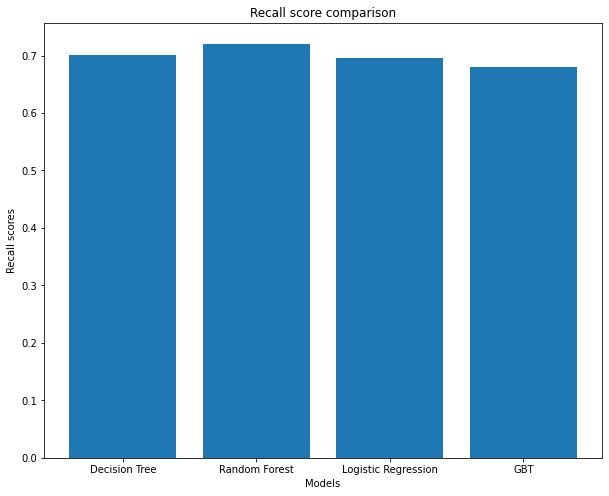

In [0]:
import matplotlib.pyplot as plt
labels = ['Decision Tree','Random Forest','Logistic Regression','GBT']
values = [recall_dt,recall_rf,recall_lr,recall_gbt]
plt.figure(figsize=(10, 8))
plt.bar(labels, values)
plt.xlabel('Models')
plt.ylabel('Recall scores')
plt.title('Recall score comparison')
plt.show()

**Other measures in different needs**

In [0]:
acc = MulticlassClassificationEvaluator(labelCol="term_deposit_index", metricName="accuracy").evaluate(results_rf) 
evaluator = MulticlassClassificationEvaluator(labelCol="term_deposit_index")
precision = evaluator.evaluate(results_rf, {evaluator.metricName: "weightedPrecision"})
f1 = evaluator.evaluate(results_rf, {evaluator.metricName: "f1"})
    
    
# print(f"AUC: {auc:.4f}")
print(f"Accuracy score: {acc:.4f}")
print(f"Precision score {precision:.4f}")
print(f"Recall score: {recall_rf:.4f}")
print(f"F1 Score: {f1:.4f}")

Accuracy score: 0.7094
Precision score 0.7304
Recall score: 0.7208
F1 Score: 0.7217
